Use any SVM Library to classify these datasets
https://drive.google.com/file/d/1wxPLNOiGmgBnP-fRqVsgVK9-Wv3juL9z/view?usp=drive_web&authuser=0





1. Use different kernels with and without regularization (40 pt)
2. Comment on each result (20 pt)
3. Visualize every single step (20 pt)
3. You are required to prepare a report and presentation discussing the following (20 pt):
  * Problem definition and motivation: the task you are working on and why it is important.
  * Dataset: describe the dataset.
  * Approach and methodology: description of your approach including data pre-processing, model parameters, and model evaluation.
  *  Implementation: Discuss the tools and libraries used in your analysis and the process you used to tune the hyperparameters.
  * Conclusion: final evaluation of your approach, things you learned during the implementation, and tips to improve your models


Bonus:
<br> * Build your own SVM. You can use any quadratic programming library to solve Lagrange equations. (5 pt)
<br> * Use GridSearchCV with various hyperparameters, kernel options, and regularization techniques to optimize your model's performance. (5 pt)

This is my attempt for this assignmnet Omar Morgan

getting the stuff we need here

In [1]:
pip install mlxtend

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import pandas as pd
import itertools

from sklearn import datasets
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from mlxtend.plotting import plot_decision_regions
from mlxtend.preprocessing import shuffle_arrays_unison
import seaborn as sns

from tqdm.notebook import tqdm_notebook as tqdm

from sklearn.svm import SVC
from sklearn.metrics import mean_absolute_error
from sklearn.svm import LinearSVR
from sklearn.svm import SVR 
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
#from sklearn.model_selection import train_test_split 

getting the first data set here 

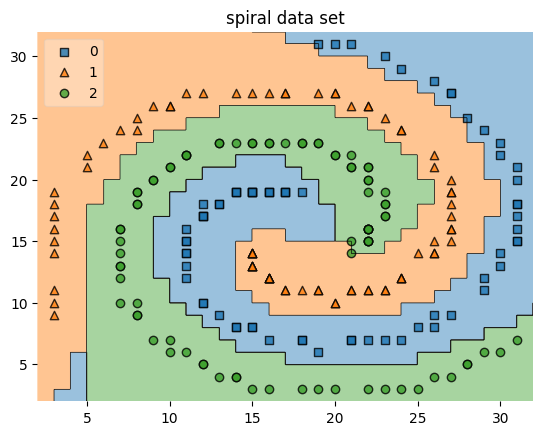

error is:  0.0


In [21]:
df_spiral = pd.read_csv("spiral.txt", sep="\t",skiprows = 7)
X_spiral = df_spiral.to_numpy().astype(int)
y_spiral = X_spiral[:,2];
y_spiral = y_spiral[:] - 1;
X_spiral = X_spiral[:,0:2];

X_train_spiral, X_test_spiral, y_train_spiral, y_test_spiral = train_test_split(X_spiral,y_spiral ,random_state=17,test_size=0.25,shuffle=True) 



svm = SVC(C=7, kernel='rbf')
svm.fit(X_train_spiral, y_train_spiral)

# Plotting decision regions
#3, colors="blue","green","yellow",
plot_decision_regions(X_train_spiral, y_train_spiral, clf=svm, legend=2)

# Adding axes annotations
#plt.xlabel('sepal length [cm]')
#plt.ylabel('petal length [cm]')
plt.title('spiral data set')
plt.show()

mae = mean_absolute_error(y_test_spiral, svm.predict(X_test_spiral))
print('error is: ' , mae)

In [4]:
# eps = 5
# svr_best_C = LinearSVR(epsilon=eps, C=C, fit_intercept=True)
# svr_best_C.fit(X_train, y_train)
# svr_results(y_test, X_test, svr_best_C)
test_mae_list = []
perc_within_eps_list = []
eps = 5
c_space = np.linspace(0.01, 10)

for c in c_space:
    varied_svr = LinearSVR(epsilon=eps, C=c,  max_iter=10000)

    varied_svr.fit(X_train_spiral, y_train_spiral)

    test_mae = mean_absolute_error(y_test_spiral, varied_svr.predict(X_test_spiral))
    test_mae_list.append(test_mae)

    perc_within_eps = 100*np.sum(abs(y_test_spiral-varied_svr.predict(X_test_spiral)) <= eps) / len(y_test_spiral)
    perc_within_eps_list.append(perc_within_eps)
print(test_mae_list)

[0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718, 0.8717948717948718]

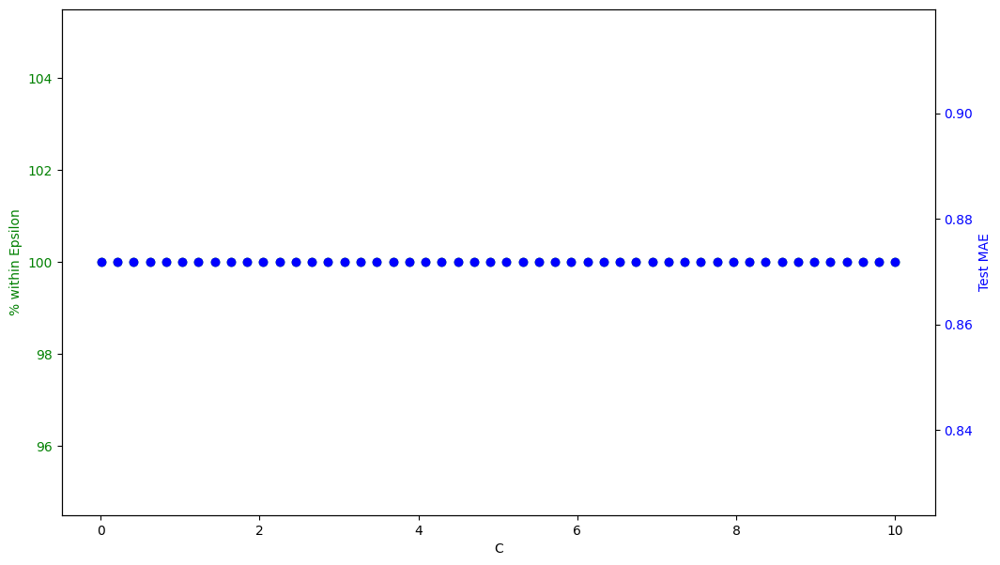

In [5]:
fig, ax1 = plt.subplots(figsize=(12,7))

color='green'
ax1.set_xlabel('C')
ax1.set_ylabel('% within Epsilon', color=color)
ax1.scatter(c_space, perc_within_eps_list, color=color)
ax1.tick_params(axis='y', labelcolor=color)

color='blue'
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_ylabel('Test MAE', color=color)  # we already handled the x-label with ax1
ax2.scatter(c_space, test_mae_list, color=color)
ax2.tick_params(axis='y', labelcolor=color)


plt.show()

the other dataset Pathbased

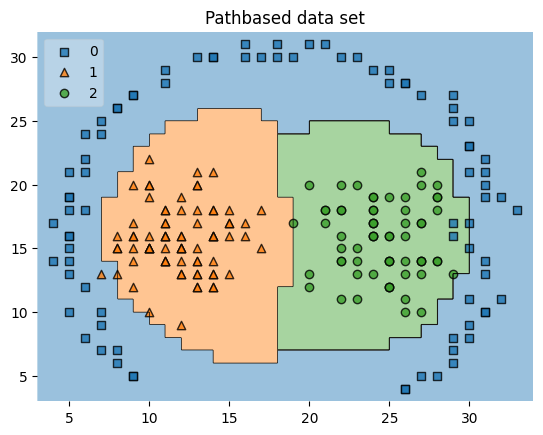

error is:  0.0


In [6]:
df_Pathbased = pd.read_csv("Pathbased.txt", sep="\t",skiprows = 7)
X_Pathbased = df_Pathbased.to_numpy().astype(int)
y_Pathbased = X_Pathbased[:,2];
y_Pathbased = y_Pathbased[:] - 1;
X_Pathbased = X_Pathbased[:,0:2];

X_train_Pathbased, X_test_Pathbased, y_train_Pathbased, y_test_Pathbased = train_test_split(X_Pathbased,y_Pathbased ,random_state=17,test_size=0.25,shuffle=True) 



svm = SVC(C=1, kernel='rbf')
svm.fit(X_train_Pathbased, y_train_Pathbased)

# Plotting decision regions
#3, colors="blue","green","yellow",
plot_decision_regions(X_train_Pathbased, y_train_Pathbased, clf=svm, legend=2)

# Adding axes annotations

plt.title('Pathbased data set')
plt.show()

mae = mean_absolute_error(y_test_Pathbased, svm.predict(X_test_Pathbased))
print('error is: ' , mae)

Jain dataset

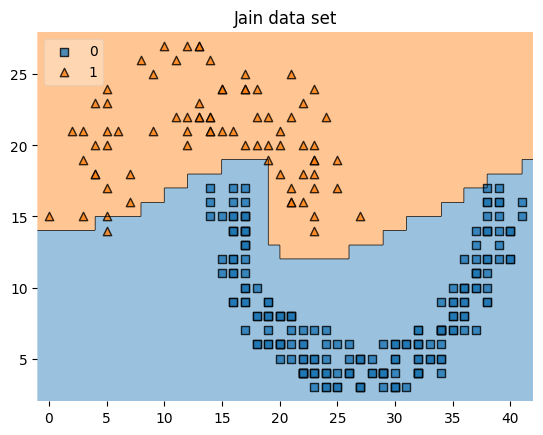

error is:  0.010752688172043012


In [7]:
df_Jain = pd.read_csv("Jain.txt", sep="\t",skiprows = 7)
X_Jain = df_Jain.to_numpy().astype(int)
y_Jain = X_Jain[:,2];
y_Jain = y_Jain[:] - 1;
X_Jain = X_Jain[:,0:2];

X_train_Jain, X_test_Jain, y_train_Jain, y_test_Jain = train_test_split(X_Jain,y_Jain ,random_state=17,test_size=0.25,shuffle=True) 



svm = SVC(C=7, kernel='poly',degree=6)
svm.fit(X_train_Jain, y_train_Jain)

# Plotting decision regions
#3, colors="blue","green","yellow",
plot_decision_regions(X_train_Jain, y_train_Jain, clf=svm, legend=2)

# Adding axes annotations

plt.title('Jain data set')
plt.show()

mae = mean_absolute_error(y_test_Jain, svm.predict(X_test_Jain))
print('error is: ' , mae)

Flame data set

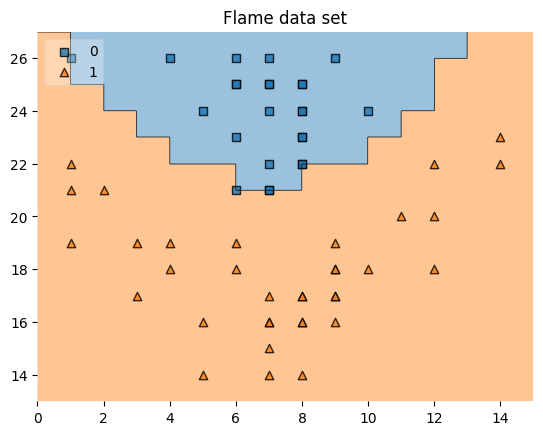

error is:  0.0


In [8]:
df_Flame = pd.read_csv("Flame.txt", sep="\t",skiprows = 7)
X_Flame = df_Flame.to_numpy().astype(int)
y_Flame = X_Flame[:,2];
y_Flame = y_Flame[:] - 1;
X_Flame = X_Flame[:,0:2];

X_train_Flame, X_test_Flame, y_train_Flame, y_test_Flame = train_test_split(X_Flame,y_Flame ,random_state=17,test_size=0.25,shuffle=True) 



svm = SVC(C=0.5, kernel='rbf')
svm.fit(X_train_Flame, y_train_Flame)

# Plotting decision regions
#3, colors="blue","green","yellow",
plot_decision_regions(X_test_Flame, y_test_Flame, clf=svm, legend=2)

# Adding axes annotations

plt.title('Flame data set')
plt.show()

mae = mean_absolute_error(y_test_Flame, svm.predict(X_test_Flame))
print('error is: ' , mae)

To get better error we can try the following 

[ 0.01        0.21387755  0.4177551   0.62163265  0.8255102   1.02938776
  1.23326531  1.43714286  1.64102041  1.84489796  2.04877551  2.25265306
  2.45653061  2.66040816  2.86428571  3.06816327  3.27204082  3.47591837
  3.67979592  3.88367347  4.08755102  4.29142857  4.49530612  4.69918367
  4.90306122  5.10693878  5.31081633  5.51469388  5.71857143  5.92244898
  6.12632653  6.33020408  6.53408163  6.73795918  6.94183673  7.14571429
  7.34959184  7.55346939  7.75734694  7.96122449  8.16510204  8.36897959
  8.57285714  8.77673469  8.98061224  9.1844898   9.38836735  9.5922449
  9.79612245 10.        ]
[0.4166666666666667, 0.05, 0.016666666666666666, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.016666666666666666, 0.016666666666666666, 0.016666666666666666, 0.016666666666666666, 0.016666666666666666, 0.016666666666666666, 0.016666666666666666, 0.016666666666666666, 0.016666666666666666, 0.0166666

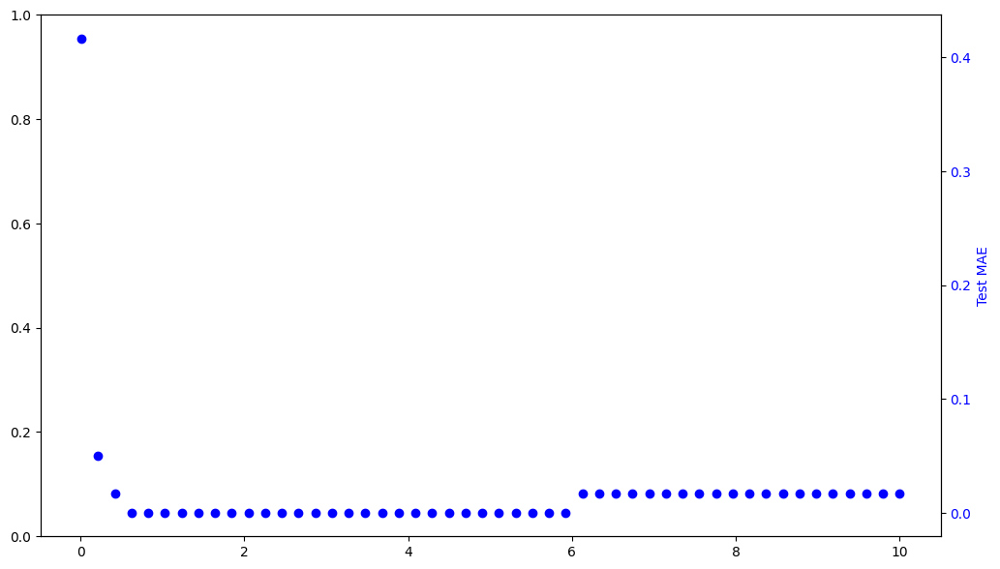

In [9]:
test_mae_list = []
perc_within_eps_list = []
eps = 1
c_space = np.linspace(0.01, 10)
print(c_space)

for c in c_space:
    varied_svr = SVC(kernel='rbf', C=c,  max_iter=10000)

    varied_svr.fit(X_train_Flame, y_train_Flame)

    test_mae = mean_absolute_error(y_test_Flame, varied_svr.predict(X_test_Flame))
    test_mae_list.append(test_mae)

    #perc_within_eps = 100*np.sum(abs(y_test_Flame-varied_svr.predict(X_test_Flame)) <= eps) / len(y_test_Flame)
    #perc_within_eps_list.append(perc_within_eps)
print(test_mae_list)
#print(perc_within_eps_list)


fig, ax1 = plt.subplots(figsize=(12,7))

# color='green'
# ax1.set_xlabel('C')
# ax1.set_ylabel('% within Epsilon', color=color)
# ax1.scatter(c_space, perc_within_eps_list, color=color)
# ax1.tick_params(axis='y', labelcolor=color)

color='blue'
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_ylabel('Test MAE', color=color)  # we already handled the x-label with ax1
ax2.scatter(c_space, test_mae_list, color=color)
ax2.tick_params(axis='y', labelcolor=color)


plt.show()

any one of the following C will do the job and provide a good result

Compound dataset

C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\mlxtend\plotting\decision_regions.py:346: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(


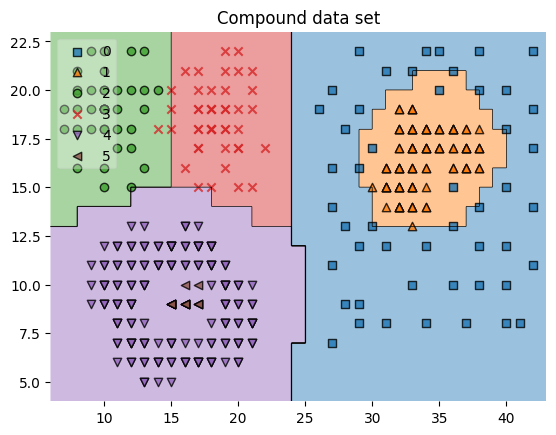

error is:  0.05778894472361809


In [10]:
df_Compound = pd.read_csv("Compound.txt", sep="\t",skiprows = 7)
X_Compound = df_Compound.to_numpy().astype(int)
y_Compound = X_Compound[:,2];
y_Compound = y_Compound[:] - 1;
X_Compound = X_Compound[:,0:2];

X_train_Compound, X_test_Compound, y_train_Compound, y_test_Compound = train_test_split(X_Compound,y_Compound ,random_state=17,test_size=0.25,shuffle=True) 



svm = SVC(C=17, kernel='rbf')
svm.fit(X_train_Compound, y_train_Compound)

# Plotting decision regions
#3, colors="blue","green","yellow",
plot_decision_regions(X_Compound, y_Compound, clf=svm, legend=2)

# Adding axes annotations

plt.title('Compound data set')
plt.show()

mae = mean_absolute_error(y_Compound, svm.predict(X_Compound))
print('error is: ' , mae)

to obtain a better result we can try the same approach here by iterating over the regulrization term

Aggregation dataSet

C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\mlxtend\plotting\decision_regions.py:346: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(


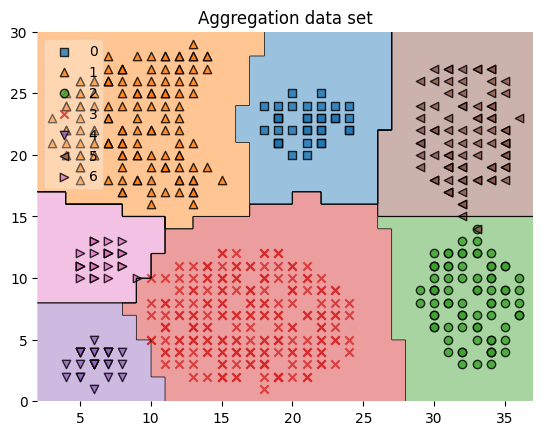

error is:  0.0


In [11]:
df_Aggregation = pd.read_csv("Aggregation.txt", sep="\t",skiprows = 7)
X_Aggregation = df_Aggregation.to_numpy().astype(int)
y_Aggregation = X_Aggregation[:,2];
y_Aggregation = y_Aggregation[:] - 1;
X_Aggregation = X_Aggregation[:,0:2];

X_train_Aggregation, X_test_Aggregation, y_train_Aggregation, y_test_Aggregation = train_test_split(X_Aggregation,y_Aggregation ,random_state=17,test_size=0.25,shuffle=True) 



svm = SVC(C=1, kernel='rbf')
svm.fit(X_train_Aggregation, y_train_Aggregation)

# Plotting decision regions
#3, colors="blue","green","yellow",
plot_decision_regions(X_train_Aggregation, y_train_Aggregation, clf=svm, legend=2)

# Adding axes annotations

plt.title('Aggregation data set')
plt.show()

mae = mean_absolute_error(y_test_Aggregation, svm.predict(X_test_Aggregation))
print('error is: ' , mae)

Trying now to use Grid Search to obtain better results

C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftware

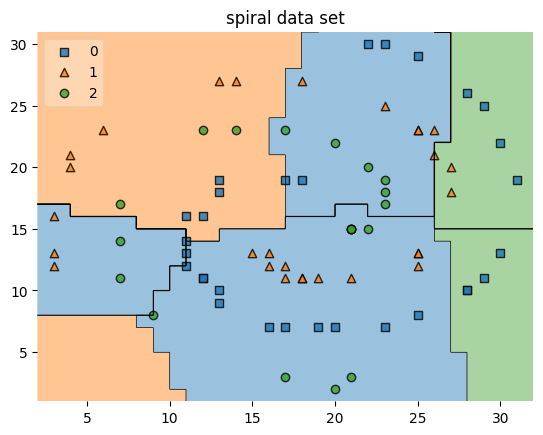

error is:  0.75


In [12]:
grid = {
    'C': np.linspace(0.01, 10),
    #'epsilon': np.linspace(0.01, 10)
    'gamma': [1, 0.1, 0.01, 0.001, 0.0001,'auto'], 
    'kernel': ['poly', 'rbf', 'sigmoid']
}

svr_gridsearch =  SVC( max_iter=10000)
grid_svr = GridSearchCV(svr_gridsearch, grid, scoring='neg_mean_absolute_error', cv=5)
grid_svr.fit(X_train_spiral, y_train_spiral)
best_grid_svr_mae = grid_svr.best_estimator_
best_grid_svr_mae.fit(X_train_spiral, y_train_spiral)
#svr_results(y_test, X_test, best_grid_svr_mae)
plot_decision_regions(X_test_spiral, y_test_spiral,clf=svm, legend=2)

# Adding axes annotations

plt.title('spiral data set')
plt.show()

mae = mean_absolute_error(y_test_Flame, svm.predict(X_test_Flame))
print('error is: ' , mae)


We observe that the result above was not the best one so we could try getting epsiolon

In [26]:
from sklearn.metrics import make_scorer
def frac_within_eps(y_true, y_pred):
    return np.sum(abs(y_true-y_pred) <= eps) / len(y_true)

def mine_mae_within(y_true,y_pred):
    within = np.sum(abs(y_true-y_pred) <= eps) / len(y_true)
    mae = -mean_absolute_error(y_true,y_pred)
    factor_care = 0.8
    return factor_care*mae + (1-factor_care)*within
    

my_scorer = make_scorer(mine_mae_within, greater_is_better=True)

C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFou

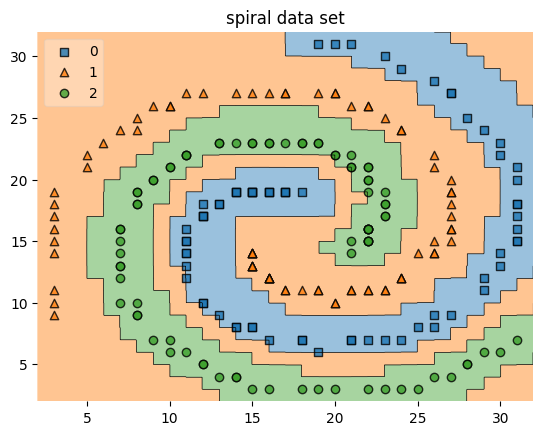

error is:  0.02313872406034262


In [14]:
grid = {
    'C': np.linspace(0.05, 10 , 50),
    'epsilon': np.linspace(0.01, 10,25),
    'gamma': [1, 0.1, 0.01, 0.001,'auto'], 
    'kernel': [ 'rbf','poly','sigmoid']
}

svr_gridsearch =  SVR( max_iter=5000 )
grid_svr_eps = GridSearchCV(svr_gridsearch, grid, scoring='neg_mean_absolute_error', cv=5)
grid_svr_eps.fit(X_train_spiral, y_train_spiral)
best_grid_svr_eps = grid_svr_eps.best_estimator_
best_grid_svr_eps.fit(X_train_spiral, y_train_spiral)


plot_decision_regions(X_train_spiral, y_train_spiral,clf=best_grid_svr_eps, legend=2)

# Adding axes annotations

plt.title('spiral data set')
plt.show()

mae = mean_absolute_error(y_test_spiral, best_grid_svr_eps.predict(X_test_spiral))
print('error is: ' , mae)

In [15]:
print(grid_svr_eps.best_estimator_)

SVR(C=7.360204081632653, epsilon=0.01, gamma=0.1, max_iter=5000)


Now trying this on a different data set 

C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFou

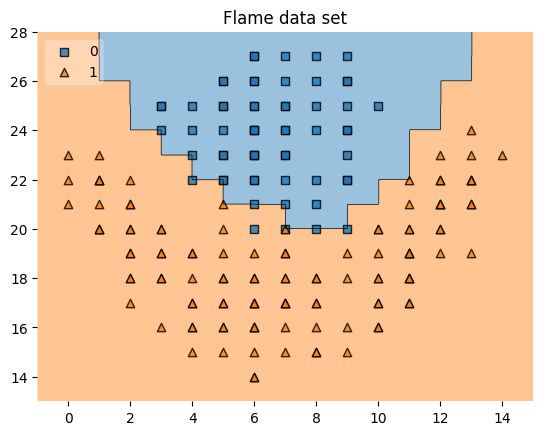

error is:  0.0328296176692184


In [16]:
grid = {
    'C': np.linspace(0.05, 10 , 50),
    'epsilon': np.linspace(0.01, 10,25),
    'gamma': [1, 0.1, 0.01, 0.001,'auto'], 
    'kernel': [ 'rbf','poly','sigmoid']
}

svr_gridsearch =  SVR( max_iter=5000 )
grid_svr_eps = GridSearchCV(svr_gridsearch, grid, scoring='neg_mean_absolute_error', cv=5)
grid_svr_eps.fit(X_train_Flame, y_train_Flame)
best_grid_svr_eps = grid_svr_eps.best_estimator_
best_grid_svr_eps.fit(X_train_Flame, y_train_Flame)


plot_decision_regions(X_train_Flame, y_train_Flame,clf=best_grid_svr_eps, legend=2)

# Adding axes annotations

plt.title('Flame data set')
plt.show()

mae = mean_absolute_error(y_test_Flame, best_grid_svr_eps.predict(X_test_Flame))
print('error is: ' , mae)

now for aggregation dataset

C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFou

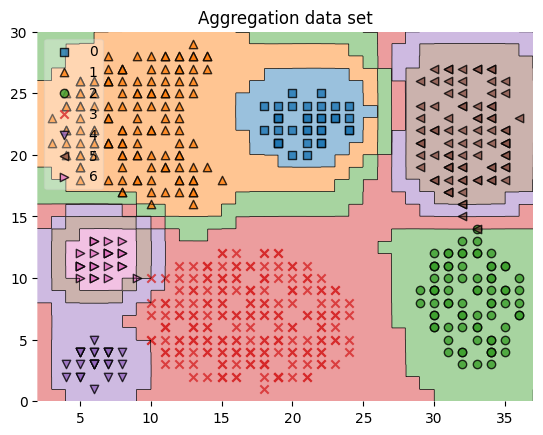

error is:  0.04953236044077201


In [17]:
svr_gridsearch =  SVR( max_iter=5000 )
grid_svr_eps = GridSearchCV(svr_gridsearch, grid, scoring='neg_mean_absolute_error', cv=5)
grid_svr_eps.fit(X_train_Aggregation, y_train_Aggregation)
best_grid_svr_eps = grid_svr_eps.best_estimator_
best_grid_svr_eps.fit(X_train_Aggregation, y_train_Aggregation)


plot_decision_regions(X_train_Aggregation, y_train_Aggregation,clf=best_grid_svr_eps, legend=2)

# Adding axes annotations

plt.title('Aggregation data set')
plt.show()

mae = mean_absolute_error(y_test_Aggregation, best_grid_svr_eps.predict(X_test_Aggregation))
print('error is: ' , mae)

now for jain data set

C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFou

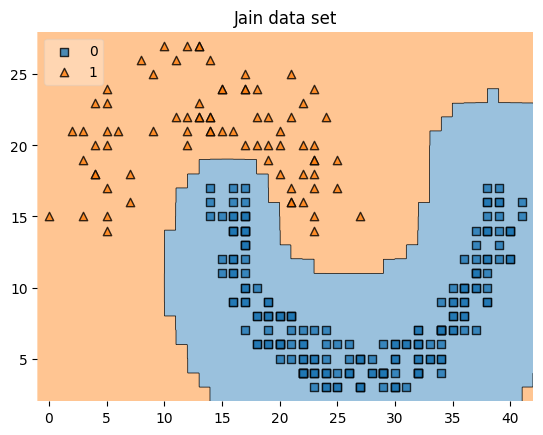

error is:  0.01610704171243052


In [18]:
svr_gridsearch =  SVR( max_iter=5000 )
grid_svr_eps = GridSearchCV(svr_gridsearch, grid, scoring='neg_mean_absolute_error', cv=5)
grid_svr_eps.fit(X_train_Jain, y_train_Jain)
best_grid_svr_eps = grid_svr_eps.best_estimator_
best_grid_svr_eps.fit(X_train_Jain, y_train_Jain)


plot_decision_regions(X_train_Jain, y_train_Jain,clf=best_grid_svr_eps, legend=2)

# Adding axes annotations

plt.title('Jain data set')
plt.show()

mae = mean_absolute_error(y_test_Jain, best_grid_svr_eps.predict(X_test_Jain))
print('error is: ' , mae)

now for Compound dataset

C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFou

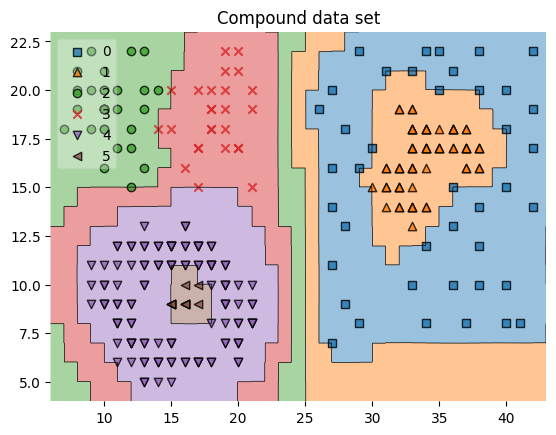

error is:  0.0900806425981129


In [19]:
svr_gridsearch =  SVR( max_iter=5000 )
grid_svr_eps = GridSearchCV(svr_gridsearch, grid, scoring='neg_mean_absolute_error', cv=5)
grid_svr_eps.fit(X_train_Compound, y_train_Compound)
best_grid_svr_eps = grid_svr_eps.best_estimator_
best_grid_svr_eps.fit(X_train_Compound, y_train_Compound)


plot_decision_regions(X_train_Compound, y_train_Compound,clf=best_grid_svr_eps, legend=2)

# Adding axes annotations

plt.title('Compound data set')
plt.show()

mae = mean_absolute_error(y_test_Compound, best_grid_svr_eps.predict(X_test_Compound))
print('error is: ' , mae)

now for Pathbased dataset

C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFou

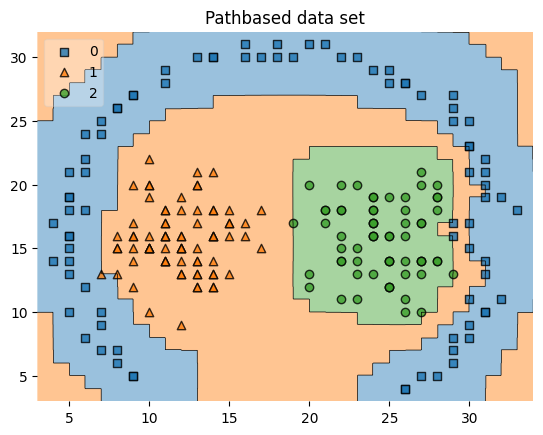

error is:  0.0635597729938794


In [25]:
svr_gridsearch =  SVR( max_iter=5000 )
grid_svr_eps = GridSearchCV(svr_gridsearch, grid, scoring='neg_mean_absolute_error', cv=5)
grid_svr_eps.fit(X_train_Pathbased, y_train_Pathbased)
best_grid_svr_eps = grid_svr_eps.best_estimator_
best_grid_svr_eps.fit(X_train_Pathbased, y_train_Pathbased)


plot_decision_regions(X_train_Pathbased, y_train_Pathbased,clf=best_grid_svr_eps, legend=2)

# Adding axes annotations

plt.title('Pathbased data set')
plt.show()

mae = mean_absolute_error(y_test_Pathbased, best_grid_svr_eps.predict(X_test_Pathbased))
print('error is: ' , mae)

now this result is very nice we were able to get some values from this

this is for testing something else

C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\svm\_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=5000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
C:\Users\WIN10\AppData\Local\Packages\PythonSoftwareFou

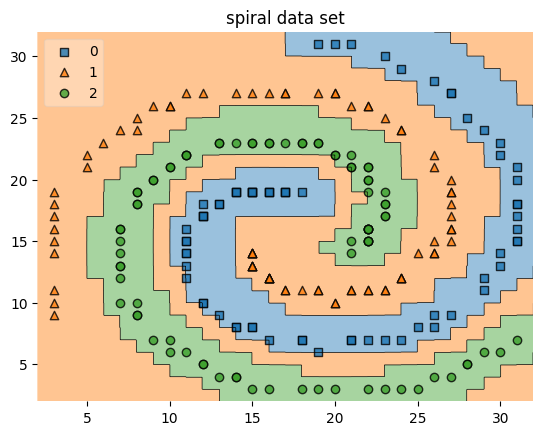

error is:  0.02313872406034262


In [27]:
grid = {
    'C': np.linspace(0.05, 10 , 50),
    'epsilon': np.linspace(0.01, 10,25),
    'gamma': [1, 0.1, 0.01, 0.001,'auto'], 
    'kernel': [ 'rbf','poly','sigmoid']
}

svr_gridsearch =  SVR( max_iter=5000 )
grid_svr_eps = GridSearchCV(svr_gridsearch, grid, scoring=my_scorer, cv=5)
grid_svr_eps.fit(X_train_spiral, y_train_spiral)
best_grid_svr_eps = grid_svr_eps.best_estimator_
best_grid_svr_eps.fit(X_train_spiral, y_train_spiral)


plot_decision_regions(X_train_spiral, y_train_spiral,clf=best_grid_svr_eps, legend=2)

# Adding axes annotations

plt.title('spiral data set')
plt.show()

mae = mean_absolute_error(y_test_spiral, best_grid_svr_eps.predict(X_test_spiral))
print('error is: ' , mae)